# Air Quality

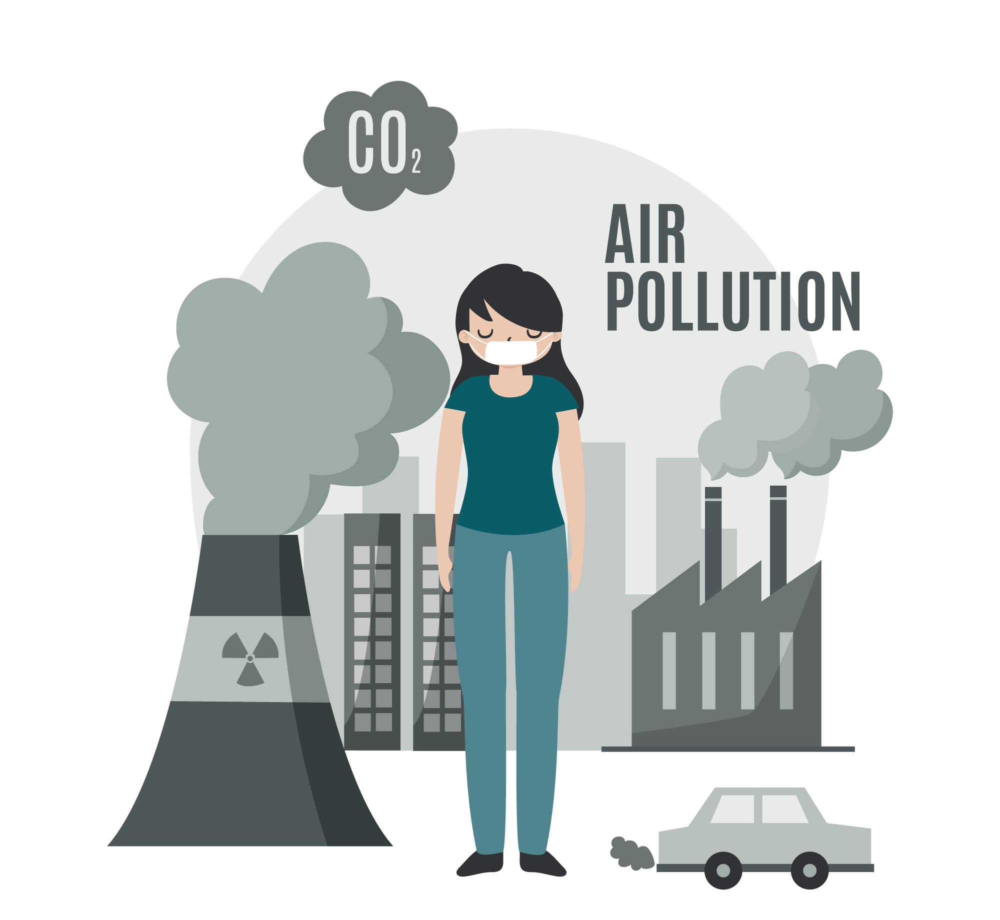

## Introduction :

Air pollution stands as a pressing global concern with far-reaching implications for both human health and environmental well-being. Prolonged exposure to suboptimal air quality, stemming from diverse sources such as vehicular emissions, industrial effluents, mold spores, and wildfires, manifests in a spectrum of adverse health effects. These include irritation of the eyes, nose, and throat, as well as respiratory challenges, cardiovascular complications, and, over extended durations, more serious health ramifications.

Beyond the human toll, the environmental repercussions of compromised air quality are equally severe. Impaired air quality has been linked to diminished crop yields, heightened vulnerability of plants to pests and diseases, and broader ecological imbalances.

Vigilant monitoring of air quality levels assumes paramount importance for safeguarding both human health and the environment. To this end, this project embarks on an exploration of the AirQuality Dataset. The objective is to develop a robust machine learning (ML) model capable of predicting temperature based on concentrations of various pollutants, including metal oxides and hydrocarbons. This undertaking not only addresses the imperative of air quality management but also provides an opportunity to delve into the intricacies of working with time-series data.


### Dataset : [Air Quality](https://archive.ics.uci.edu/dataset/360/air+quality)


## Dataset Information

The dataset contains 9358 instances of hourly averaged responses from an array of 5 metal oxide chemical sensors embedded in an Air Quality Chemical Multisensor Device. The device was located on the field in a significantly polluted area, at road level,within an Italian city. Data were recorded from March 2004 to February 2005 (one year)representing the longest freely available recordings of on field deployed air quality chemical sensor devices responses. Ground Truth hourly averaged concentrations for CO, Non Metanic Hydrocarbons, Benzene, Total Nitrogen Oxides (NOx) and Nitrogen Dioxide (NO2)  and were provided by a co-located reference certified analyzer. Evidences of cross-sensitivities as well as both concept and sensor drifts are present as described in De Vito et al., Sens. And Act. B, Vol. 129,2,2008 (citation required) eventually affecting sensors concentration estimation capabilities. Missing values are tagged with -200 value.
This dataset can be used exclusively for research purposes. Commercial purposes are fully excluded.

### Attribute Information

* Date (DD/MM/YYYY)

* Time (HH.MM.SS)

* True hourly averaged concentration CO in mg/m^3 (reference analyzer)

* PT08.S1 (tin oxide) hourly averaged sensor response (nominally CO targeted)

* True hourly averaged overall Non Metanic HydroCarbons concentration in microg/m^3 (reference analyzer)

* True hourly averaged Benzene concentration in microg/m^3 (reference analyzer)

* PT08.S2 (titania) hourly averaged sensor response (nominally NMHC targeted)

* True hourly averaged NOx concentration in ppb (reference analyzer)

* PT08.S3 (tungsten oxide) hourly averaged sensor response (nominally NOx targeted)

* True hourly averaged NO2 concentration in microg/m^3 (reference analyzer)

* PT08.S4 (tungsten oxide) hourly averaged sensor response (nominally NO2 targeted)

* PT08.S5 (indium oxide) hourly averaged sensor response (nominally O3 targeted)

* Temperature in Â°C

* Relative Humidity (%)

* AH Absolute Humidity

### Importing Libraries

In [1]:
import pandas as pd
import numpy as np
from tqdm import *

import matplotlib.pyplot as plt
from matplotlib.widgets import Slider, Button
import seaborn as sns

import datetime

from ydata_profiling import ProfileReport
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import DotProduct, WhiteKernel , RBF
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_predict
import pickle
import scipy.stats as stats

# For warnings
import warnings
warnings.filterwarnings("ignore")

### Importing the Dataset

In [2]:
df = pd.read_csv("AirQuality.csv", sep = ";", decimal = ",")  
df.drop(['Unnamed: 15','Unnamed: 16'], axis = 1, inplace = True, errors = 'ignore') 
df.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18.00.00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,10/03/2004,19.00.00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,10/03/2004,20.00.00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,10/03/2004,21.00.00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,10/03/2004,22.00.00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888


In [3]:
df.shape

(9471, 15)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9471 entries, 0 to 9470
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           9357 non-null   object 
 1   Time           9357 non-null   object 
 2   CO(GT)         9357 non-null   float64
 3   PT08.S1(CO)    9357 non-null   float64
 4   NMHC(GT)       9357 non-null   float64
 5   C6H6(GT)       9357 non-null   float64
 6   PT08.S2(NMHC)  9357 non-null   float64
 7   NOx(GT)        9357 non-null   float64
 8   PT08.S3(NOx)   9357 non-null   float64
 9   NO2(GT)        9357 non-null   float64
 10  PT08.S4(NO2)   9357 non-null   float64
 11  PT08.S5(O3)    9357 non-null   float64
 12  T              9357 non-null   float64
 13  RH             9357 non-null   float64
 14  AH             9357 non-null   float64
dtypes: float64(13), object(2)
memory usage: 1.1+ MB


In [5]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
CO(GT),9357.0,-34.207524,77.657170,-200.0,0.6000,1.5000,2.6000,11.900
PT08.S1(CO),9357.0,1048.990061,329.832710,-200.0,921.0000,1053.0000,1221.0000,2040.000
NMHC(GT),9357.0,-159.090093,139.789093,-200.0,-200.0000,-200.0000,-200.0000,1189.000
C6H6(GT),9357.0,1.865683,41.380206,-200.0,4.0000,7.9000,13.6000,63.700
PT08.S2(NMHC),9357.0,894.595276,342.333252,-200.0,711.0000,895.0000,1105.0000,2214.000
NOx(GT),9357.0,168.616971,257.433866,-200.0,50.0000,141.0000,284.0000,1479.000
PT08.S3(NOx),9357.0,794.990168,321.993552,-200.0,637.0000,794.0000,960.0000,2683.000
NO2(GT),9357.0,58.148873,126.940455,-200.0,53.0000,96.0000,133.0000,340.000
PT08.S4(NO2),9357.0,1391.479641,467.210125,-200.0,1185.0000,1446.0000,1662.0000,2775.000
PT08.S5(O3),9357.0,975.072032,456.938184,-200.0,700.0000,942.0000,1255.0000,2523.000


* **Missing values are tagged with -200 value.**

In [6]:
# Replacing bad sensor readings designated by an entry of -200 with NaN
df.replace(to_replace = -200, value = np.nan, inplace = True)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9471 entries, 0 to 9470
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           9357 non-null   object 
 1   Time           9357 non-null   object 
 2   CO(GT)         7674 non-null   float64
 3   PT08.S1(CO)    8991 non-null   float64
 4   NMHC(GT)       914 non-null    float64
 5   C6H6(GT)       8991 non-null   float64
 6   PT08.S2(NMHC)  8991 non-null   float64
 7   NOx(GT)        7718 non-null   float64
 8   PT08.S3(NOx)   8991 non-null   float64
 9   NO2(GT)        7715 non-null   float64
 10  PT08.S4(NO2)   8991 non-null   float64
 11  PT08.S5(O3)    8991 non-null   float64
 12  T              8991 non-null   float64
 13  RH             8991 non-null   float64
 14  AH             8991 non-null   float64
dtypes: float64(13), object(2)
memory usage: 1.1+ MB


In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
CO(GT),7674.0,2.152750,1.453252,0.1000,1.1000,1.8000,2.9000,11.900
PT08.S1(CO),8991.0,1099.833166,217.080037,647.0000,937.0000,1063.0000,1231.0000,2040.000
NMHC(GT),914.0,218.811816,204.459921,7.0000,67.0000,150.0000,297.0000,1189.000
C6H6(GT),8991.0,10.083105,7.449820,0.1000,4.4000,8.2000,14.0000,63.700
PT08.S2(NMHC),8991.0,939.153376,266.831429,383.0000,734.5000,909.0000,1116.0000,2214.000
NOx(GT),7718.0,246.896735,212.979168,2.0000,98.0000,180.0000,326.0000,1479.000
PT08.S3(NOx),8991.0,835.493605,256.817320,322.0000,658.0000,806.0000,969.5000,2683.000
NO2(GT),7715.0,113.091251,48.370108,2.0000,78.0000,109.0000,142.0000,340.000
PT08.S4(NO2),8991.0,1456.264598,346.206794,551.0000,1227.0000,1463.0000,1674.0000,2775.000
PT08.S5(O3),8991.0,1022.906128,398.484288,221.0000,731.5000,963.0000,1273.5000,2523.000


In [9]:
df.isnull().sum()

Date              114
Time              114
CO(GT)           1797
PT08.S1(CO)       480
NMHC(GT)         8557
C6H6(GT)          480
PT08.S2(NMHC)     480
NOx(GT)          1753
PT08.S3(NOx)      480
NO2(GT)          1756
PT08.S4(NO2)      480
PT08.S5(O3)       480
T                 480
RH                480
AH                480
dtype: int64

In [10]:
round( 100*( df.isnull().sum() / len(df.index) ), 2 ).sort_values(ascending = False)

NMHC(GT)         90.35
CO(GT)           18.97
NO2(GT)          18.54
NOx(GT)          18.51
PT08.S1(CO)       5.07
C6H6(GT)          5.07
PT08.S2(NMHC)     5.07
PT08.S3(NOx)      5.07
PT08.S4(NO2)      5.07
PT08.S5(O3)       5.07
T                 5.07
RH                5.07
AH                5.07
Date              1.20
Time              1.20
dtype: float64

### Removing Null Values

In [11]:
df.drop('NMHC(GT)', axis = 1, inplace = True, errors = 'ignore') 

df.head()

,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18.00.00,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,10/03/2004,19.00.00,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,10/03/2004,20.00.00,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,10/03/2004,21.00.00,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,10/03/2004,22.00.00,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888


In [12]:
df = df.dropna()

In [13]:
df.shape

(6941, 14)

### Exploratory Data Analysis

In [14]:
df['DateTime'] =  df['Date'] + ' ' + df['Time']

df.DateTime = df.DateTime.apply(lambda x: datetime.datetime.strptime(x, '%d/%m/%Y %H.%M.%S'))

df['Weekday'] = df['DateTime'].dt.day_name()
df['Month']   = df['DateTime'].dt.month_name()
df['Hour']    = df['DateTime'].dt.hour

df['Date']    = pd.to_datetime(df['Date'], format = '%d/%m/%Y')

df.drop('Time', axis = 1, inplace = True, errors = 'ignore') 

df = df[['Date', 'Month', 'Weekday', 'Hour', 'DateTime', 'CO(GT)','PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)', 
         'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH', 'AH']]

df.head()

,Date,Month,Weekday,Hour,DateTime,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10,March,Wednesday,18,2004-03-10 18:00:00,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,2004-03-10,March,Wednesday,19,2004-03-10 19:00:00,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,2004-03-10,March,Wednesday,20,2004-03-10 20:00:00,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,2004-03-10,March,Wednesday,21,2004-03-10 21:00:00,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,2004-03-10,March,Wednesday,22,2004-03-10 22:00:00,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888


In [15]:
for i in df.columns:
    print("Count of unique values in \033[1m{}\033[0m column are \033[1m{}\033[0m.".format(i, df[i].nunique()))

Count of unique values in Date column are 341.
Count of unique values in Month column are 12.
Count of unique values in Weekday column are 7.
Count of unique values in Hour column are 24.
Count of unique values in DateTime column are 6941.
Count of unique values in CO(GT) column are 94.
Count of unique values in PT08.S1(CO) column are 1016.
Count of unique values in C6H6(GT) column are 392.
Count of unique values in PT08.S2(NMHC) column are 1189.
Count of unique values in NOx(GT) column are 896.
Count of unique values in PT08.S3(NOx) column are 1129.
Count of unique values in NO2(GT) column are 274.
Count of unique values in PT08.S4(NO2) column are 1543.
Count of unique values in PT08.S5(O3) column are 1693.
Count of unique values in T column are 428.
Count of unique values in RH column are 742.
Count of unique values in AH column are 5460.


In [16]:
for i in df.columns:
    print("Minimum and Maximum value in \033[1m{}\033[0m column are \033[1m{}\033[0m and \033[1m{}\033[0m respectively.".format(i, df[i].min(), df[i].max()))

Minimum and Maximum value in Date column are 2004-03-10 00:00:00 and 2005-04-04 00:00:00 respectively.
Minimum and Maximum value in Month column are April and September respectively.
Minimum and Maximum value in Weekday column are Friday and Wednesday respectively.
Minimum and Maximum value in Hour column are 0 and 23 respectively.
Minimum and Maximum value in DateTime column are 2004-03-10 18:00:00 and 2005-04-04 14:00:00 respectively.
Minimum and Maximum value in CO(GT) column are 0.1 and 11.9 respectively.
Minimum and Maximum value in PT08.S1(CO) column are 647.0 and 2040.0 respectively.
Minimum and Maximum value in C6H6(GT) column are 0.2 and 63.7 respectively.
Minimum and Maximum value in PT08.S2(NMHC) column are 390.0 and 2214.0 respectively.
Minimum and Maximum value in NOx(GT) column are 2.0 and 1479.0 respectively.
Minimum and Maximum value in PT08.S3(NOx) column are 322.0 and 2683.0 respectively.
Minimum and Maximum value in NO2(GT) column are 2.0 and 333.0 respectively.
Mini

In [17]:
l = ['Date', 'Hour', 'DateTime', 'CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 
     'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH', 'AH']
for i in l:
    q1 = df[i].quantile(0.25)
    q3 = df[i].quantile(0.75)
    iqr = q3-q1
    upper = q3 +1.5*iqr
    lower = q1 -1.5*iqr
    outliner_df = df.loc[(df[i] < lower)|(df[i] > upper)]
    print('Percentage of outlier in \033[1m{0}\033[0m column is \033[1m{1}\033[0m%.'.format(i, round((outliner_df.shape[0]/df.shape[0])*100),2))

Percentage of outlier in Date column is 0%.
Percentage of outlier in Hour column is 0%.
Percentage of outlier in DateTime column is 0%.
Percentage of outlier in CO(GT) column is 3%.
Percentage of outlier in PT08.S1(CO) column is 1%.
Percentage of outlier in C6H6(GT) column is 2%.
Percentage of outlier in PT08.S2(NMHC) column is 1%.
Percentage of outlier in NOx(GT) column is 5%.
Percentage of outlier in PT08.S3(NOx) column is 3%.
Percentage of outlier in NO2(GT) column is 1%.
Percentage of outlier in PT08.S4(NO2) column is 1%.
Percentage of outlier in PT08.S5(O3) column is 1%.
Percentage of outlier in T column is 0%.
Percentage of outlier in RH column is 0%.
Percentage of outlier in AH column is 0%.


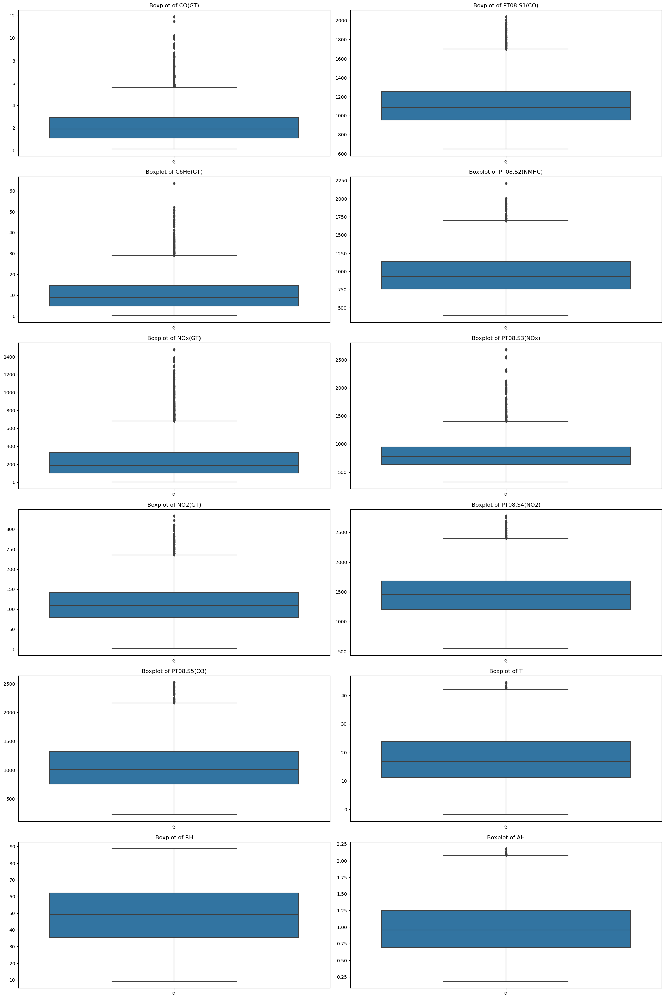

In [18]:
l = ['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 
     'T', 'RH', 'AH']

plt.figure(figsize = (20,30))
j = 1
for i in l:
    plt.subplot(6, 2, j)
    sns.boxplot(df[i])
    plt.title("Boxplot of {}".format(i))
    plt.xticks(rotation = 30)
    j = j+1
plt.tight_layout()

In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6941 entries, 0 to 9356
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           6941 non-null   datetime64[ns]
 1   Month          6941 non-null   object        
 2   Weekday        6941 non-null   object        
 3   Hour           6941 non-null   int32         
 4   DateTime       6941 non-null   datetime64[ns]
 5   CO(GT)         6941 non-null   float64       
 6   PT08.S1(CO)    6941 non-null   float64       
 7   C6H6(GT)       6941 non-null   float64       
 8   PT08.S2(NMHC)  6941 non-null   float64       
 9   NOx(GT)        6941 non-null   float64       
 10  PT08.S3(NOx)   6941 non-null   float64       
 11  NO2(GT)        6941 non-null   float64       
 12  PT08.S4(NO2)   6941 non-null   float64       
 13  PT08.S5(O3)    6941 non-null   float64       
 14  T              6941 non-null   float64       
 15  RH             6941 non-nu

### Removing Outliers

In [20]:
# Select only numeric columns
numeric_cols = df.select_dtypes(include=[np.number])

# Calculate quartiles for numeric columns
Q1 = numeric_cols.quantile(0.25)
Q3 = numeric_cols.quantile(0.75)
IQR = Q3 - Q1

scale = 1.4
lower_lim = Q1 - scale * IQR
upper_lim = Q3 + scale * IQR

# Mask to remove rows with outliers
condition = ~((numeric_cols < lower_lim) | (numeric_cols > upper_lim)).any(axis=1)

# Apply mask to original DataFrame
df_filtered = df[condition]

In [21]:
df.reset_index(drop = True, inplace = True)
report = ProfileReport(df)
#report

In [22]:
df_filtered.reset_index(drop = True, inplace = True) 
report = ProfileReport(df_filtered)
#report

* **C6H6** is a hydrocarbon and we have another sensor that is detecting nonmetallic hydrocarbons (NMHC). Therefore, the C6H6 column is sorta redundant and we can drop it without losing too much information.

* **NOx**, we still have a sensor in the dataframe responsible for detecting nitrous oxides. This means that the NOx column is similarly redundant.

* **CO(GT)**, we still have a sensor in the dataframe responsible for specifically detecting CO. This means that the CO(GT) column is also redundant.

* Using that same logic, I'll drop the **NO2(GT)** column as well.

In [23]:
df_filtered.drop(['CO(GT)']  , axis = 1, inplace = True, errors = 'ignore')
df_filtered.drop(['NOx(GT)'] , axis = 1, inplace = True, errors = 'ignore')
df_filtered.drop(['C6H6(GT)'], axis = 1, inplace = True, errors = 'ignore')
df_filtered.drop(['NO2(GT)'] , axis = 1, inplace = True, errors = 'ignore')
df_filtered.head()

,Date,Month,Weekday,Hour,DateTime,PT08.S1(CO),PT08.S2(NMHC),PT08.S3(NOx),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10,March,Wednesday,18,2004-03-10 18:00:00,1360.0,1046.0,1056.0,1692.0,1268.0,13.6,48.9,0.7578
1,2004-03-10,March,Wednesday,19,2004-03-10 19:00:00,1292.0,955.0,1174.0,1559.0,972.0,13.3,47.7,0.7255
2,2004-03-10,March,Wednesday,20,2004-03-10 20:00:00,1402.0,939.0,1140.0,1555.0,1074.0,11.9,54.0,0.7502
3,2004-03-10,March,Wednesday,21,2004-03-10 21:00:00,1376.0,948.0,1092.0,1584.0,1203.0,11.0,60.0,0.7867
4,2004-03-10,March,Wednesday,22,2004-03-10 22:00:00,1272.0,836.0,1205.0,1490.0,1110.0,11.2,59.6,0.7888


In [24]:
df_filtered.reset_index(drop = True, inplace = True) 
report = ProfileReport(df_filtered)
#report

### Time Series on Air Quality Data

In [25]:
month_df_list = []
day_df_list   = []
hour_df_list  = []

months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 
          'December']

days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

for month in months:
    temp_df = df_filtered.loc[(df_filtered['Month'] == month)]
    month_df_list.append(temp_df)

for day in days:
    temp_df = df_filtered.loc[(df_filtered['Weekday'] == day)]
    day_df_list.append(temp_df)

for hour in range(24):
    temp_df = df_filtered.loc[(df_filtered['Hour'] == hour)]
    hour_df_list.append(temp_df)

In [26]:
def df_time_plotter(df_list, time_unit, y_col):
    
    months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 
              'December']
    
    days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
    
    if time_unit == 'M':
        nRows = 3
        nCols = 4
        n_iter = len(months)
    elif time_unit == 'D':
        nRows = 2
        nCols = 4
        n_iter = len(days)
    elif time_unit == 'H':
        nRows = 4
        nCols = 6
        n_iter = 24
    else:
        print('time_unit must be a string equal to M,D, or H')
        return 0
        
    fig, axs = plt.subplots(nrows = nRows, ncols = nCols, figsize = (40, 30))
    axs = axs.ravel()
    for i in range(n_iter):
        data = df_list[i]
        ax = axs[i]
        data.plot(kind ='scatter', x = 'DateTime', y = y_col , ax = ax, fontsize = 24)
        ax.set_ylabel('Pollutant Concentration', fontsize = 30)
        ax.set_xlabel('')
        if time_unit == 'M':
            ax.set_title(y_col + ' ' + months[i],  size = 40) 
        elif time_unit == 'D':
            ax.set_title(y_col + ' ' + days[i],  size = 40) 
        else:
             ax.set_title(y_col + ' ' + str(i),  size = 40) 
        ax.tick_params(labelrotation = 60)

        
    # set the spacing between subplots
    plt.subplots_adjust(left = 0.1, bottom = 0.1, right = 0.9, top = 0.9, wspace = 0.4,  hspace = 0.5)
    plt.show() 

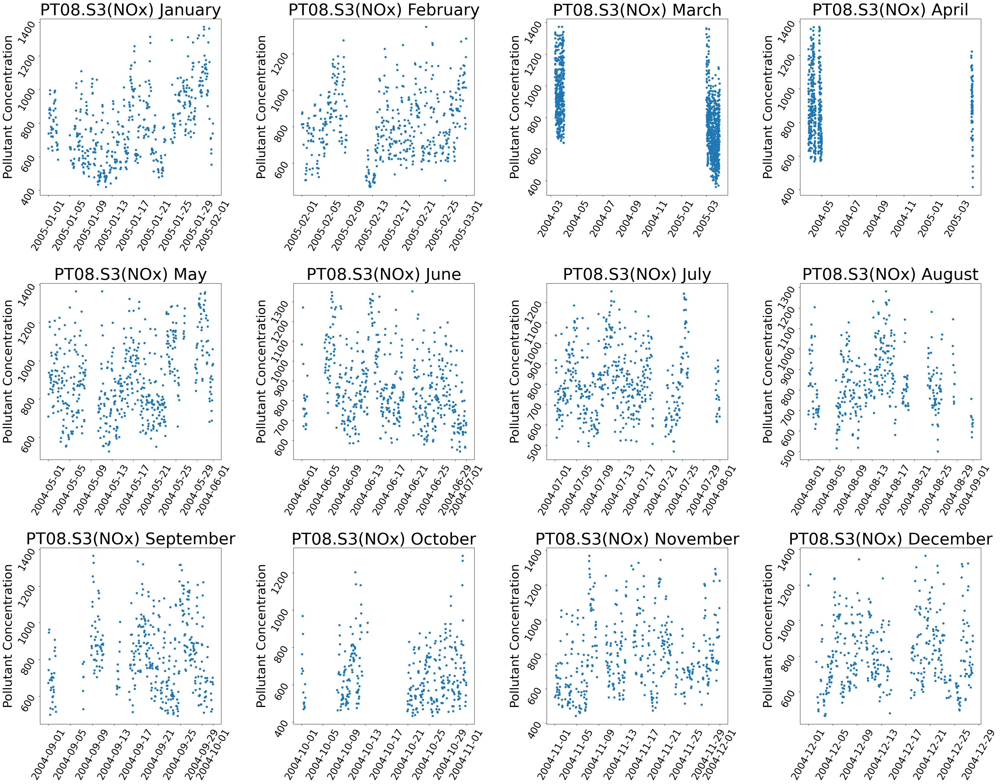

In [27]:
df_time_plotter(month_df_list, 'M', 'PT08.S3(NOx)')

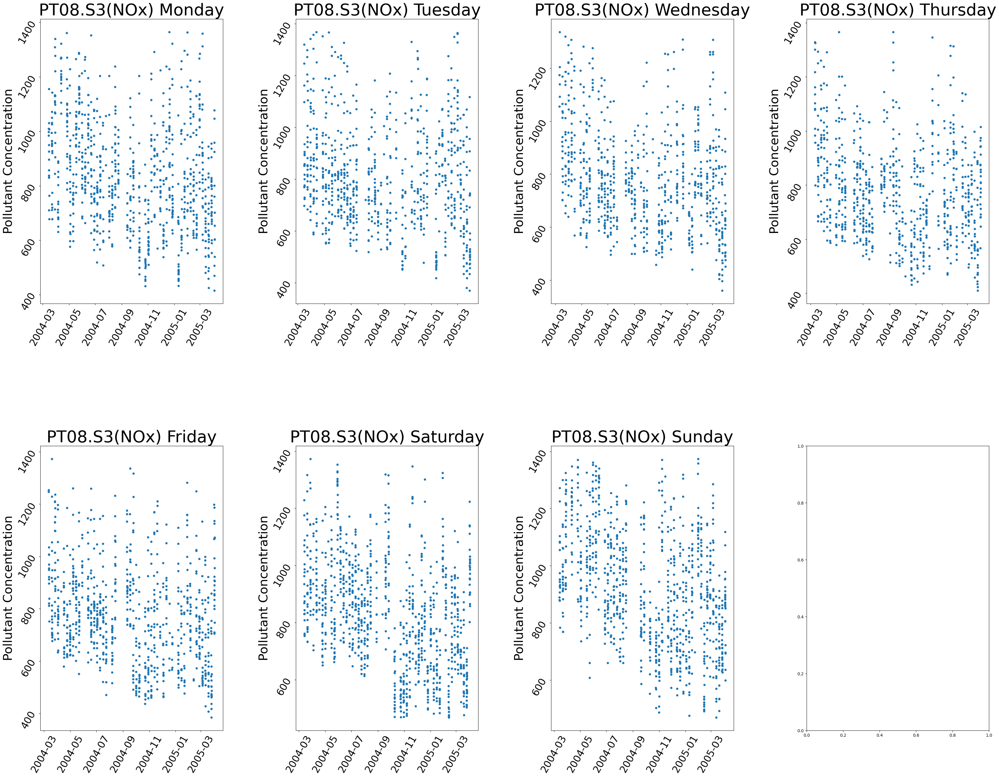

In [28]:
df_time_plotter(day_df_list, 'D', 'PT08.S3(NOx)')

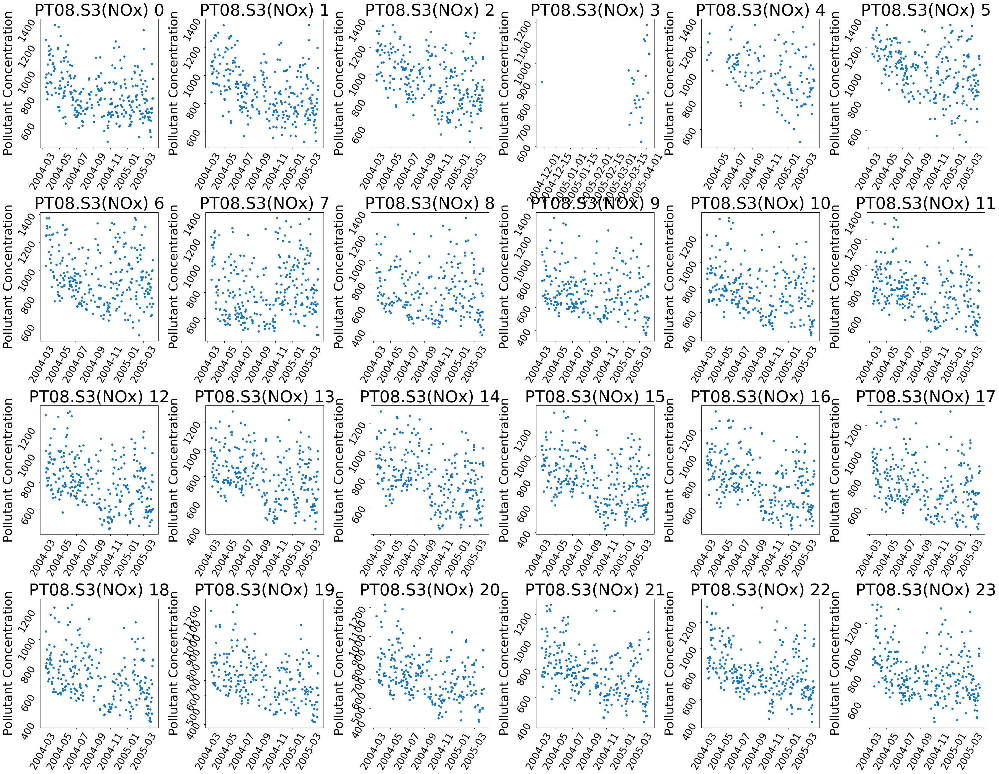

In [29]:
df_time_plotter(hour_df_list, 'H', 'PT08.S3(NOx)')

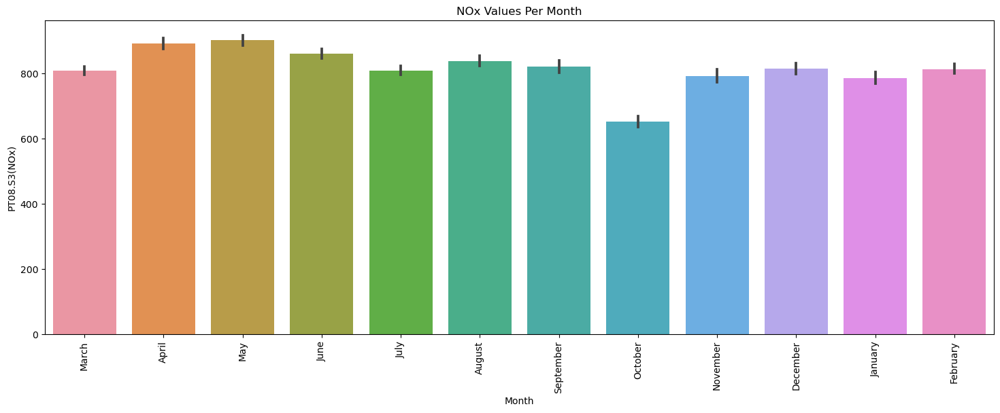

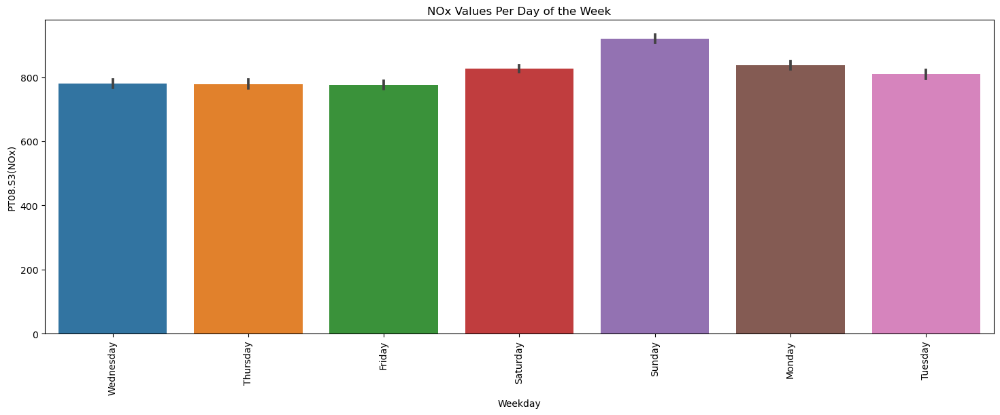

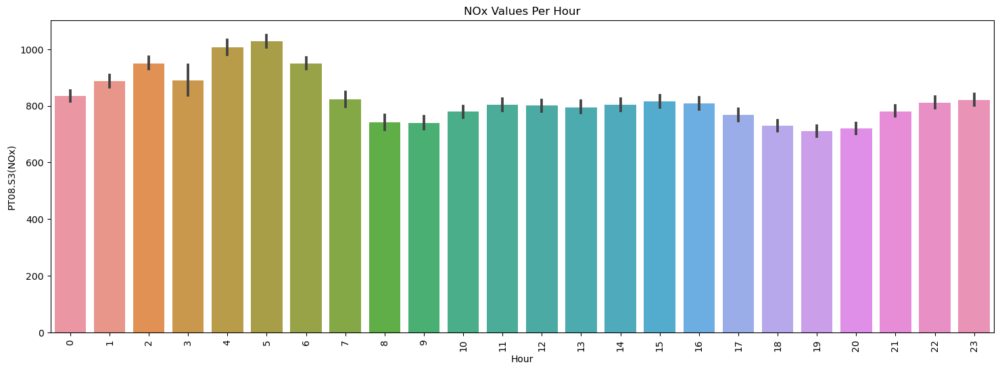

In [30]:
plt.figure(figsize = (18, 6))

sns.barplot(x = 'Month', y = 'PT08.S3(NOx)', data = df_filtered)
plt.title('NOx Values Per Month')
plt.xticks(rotation = 90)
plt.show()

plt.figure(figsize = (18, 6))
sns.barplot(x = 'Weekday', y = 'PT08.S3(NOx)', data = df_filtered)
plt.title('NOx Values Per Day of the Week')
plt.xticks(rotation = 90)
plt.show()

plt.figure(figsize = (18, 6))
sns.barplot(x = 'Hour', y = 'PT08.S3(NOx)', data = df_filtered)
plt.title('NOx Values Per Hour')
plt.xticks(rotation = 90)
plt.show()

In [31]:
df_final = df_filtered.iloc[:, 5:]
df_final

,PT08.S1(CO),PT08.S2(NMHC),PT08.S3(NOx),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,1360.0,1046.0,1056.0,1692.0,1268.0,13.6,48.9,0.7578
1,1292.0,955.0,1174.0,1559.0,972.0,13.3,47.7,0.7255
2,1402.0,939.0,1140.0,1555.0,1074.0,11.9,54.0,0.7502
3,1376.0,948.0,1092.0,1584.0,1203.0,11.0,60.0,0.7867
4,1272.0,836.0,1205.0,1490.0,1110.0,11.2,59.6,0.7888
...,...,...,...,...,...,...,...,...
6094,1314.0,1101.0,539.0,1374.0,1729.0,21.9,29.3,0.7568
6095,1163.0,1027.0,604.0,1264.0,1269.0,24.3,23.7,0.7119
6096,1142.0,1063.0,603.0,1241.0,1092.0,26.9,18.3,0.6406
6097,1003.0,961.0,702.0,1041.0,770.0,28.3,13.5,0.5139


In [32]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6099 entries, 0 to 6098
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   PT08.S1(CO)    6099 non-null   float64
 1   PT08.S2(NMHC)  6099 non-null   float64
 2   PT08.S3(NOx)   6099 non-null   float64
 3   PT08.S4(NO2)   6099 non-null   float64
 4   PT08.S5(O3)    6099 non-null   float64
 5   T              6099 non-null   float64
 6   RH             6099 non-null   float64
 7   AH             6099 non-null   float64
dtypes: float64(8)
memory usage: 381.3 KB


### PreProcessing Data

In [33]:
X = df_final.drop(columns = ['PT08.S3(NOx)'])
y = df_final['PT08.S3(NOx)']

In [34]:
print(X.shape)
print(y.shape)

(6099, 7)
(6099,)


### Splitting the dataset and Building Machine Learning Models

In [35]:
def model_assess(X_train, X_test, y_train, y_test, model, title = "Default"):
    
    model.fit(X_train, y_train)
    y_train_pred = model.predict(X_train)
    y_test_pred  = model.predict(X_test)
    
    train_mse = mean_squared_error(y_train, y_train_pred)
    train_r2  = r2_score(y_train, y_train_pred)
    test_mse  = mean_squared_error(y_test, y_test_pred)
    test_r2   = r2_score(y_test, y_test_pred)
    
    results = pd.DataFrame([title,train_mse, train_r2, test_mse, test_r2]).transpose()
    results.columns = ['Method','Training MSE','Training R2','Test MSE','Test R2']
    return y_train_pred, y_test_pred, results

def multi_model_assess(df, models, y_predict):
    all_model_results = [] #This will contain all model results for each dependent variable 
    all_X_test    = []
    all_X_train   = []
    all_y_test_p  = []
    all_y_train_p = []
    all_y_train   = []
    
    #First loop will define dependent/independent variables and split data into test/training sets
    n_vars = len(y_predict)
    pbar = tqdm(range(n_vars), desc = "Variable Processed", position = 0, leave = True) #Add progress bar 
    
    for dependent in y_predict:
        model_results = [] #Array with dataframes for a given dependent variable
        
        #Designate independent and dependent variables
        x  = df.drop([dependent], axis = 1)
        y  = df[dependent]
        
        #Split data into test and training sets
        X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 42)
        
        #Populate the array of observed values for the dependent variable
        all_y_train.append(y_train)
        
        #Process each of the desired models
        for model, model_name in models:
            y_train_pred,y_test_pred, results = model_assess(X_train, X_test, y_train, y_test, model, title = model_name)
            
            model_results.append(results)
            all_X_test.append(X_test)
            all_X_train.append(X_train)
            all_y_test_p.append(y_test_pred)
            all_y_train_p.append(y_train_pred)
                    
        all_model_results.append(model_results)
        pbar.update(1)
        pbar.refresh()
        
    pbar.close()   
    return all_model_results, all_X_test, all_X_train, all_y_test_p, all_y_train_p, all_y_train

In [36]:
#Initiate Different Regressors for ML model
lr = LinearRegression() 
rf = RandomForestRegressor(n_estimators = 100, max_depth = 3, random_state = 42)
gb = GradientBoostingRegressor(n_estimators = 100, max_depth = 3, random_state = 42)
kn = KNeighborsRegressor()
ab = AdaBoostRegressor()
sv = SVR()
nn = MLPRegressor(hidden_layer_sizes = 500, solver = 'adam', learning_rate_init = 1e-2, max_iter = 500)

models =  [(lr,'Linear Regression'), 
           (rf,'Random Forest'), 
           (gb,'Gradient Boosting'),
           (kn,'K-Neighbors'), 
           (ab,'Ada Boost'), 
           (sv,'SVR'), 
           (nn,'MLP')]

y_predict  = ['PT08.S1(CO)','PT08.S2(NMHC)','PT08.S3(NOx)','PT08.S4(NO2)','PT08.S5(O3)']

all_model_results, _, _, all_y_test_p, all_y_train_p, all_y_train = multi_model_assess(df_final, models, y_predict)

Variable Processed: 100%|████████████████████████████████████████████████████████████████| 5/5 [02:22<00:00, 28.45s/it]


In [37]:
score_df_results = pd.concat(all_model_results[0], ignore_index = True).sort_values('Test R2', axis = 0, ascending = False)
score_df_results

,Method,Training MSE,Training R2,Test MSE,Test R2
2,Gradient Boosting,2975.862799,0.909353,3976.0849,0.885359
3,K-Neighbors,2611.867383,0.92044,4088.343705,0.882122
0,Linear Regression,5613.514349,0.829008,5698.548012,0.835696
4,Ada Boost,5625.557804,0.828641,5900.059846,0.829886
6,MLP,6463.298529,0.803123,6557.592917,0.810928
1,Random Forest,6753.178425,0.794293,7355.771574,0.787914
5,SVR,7165.926266,0.78172,7616.963169,0.780383


In [38]:
score_results_test = pd.concat(all_model_results[0], ignore_index = True)
score_results_test['Test R2'][0]

0.8356960503616119

In [39]:
#Define column with model to predict
y_predict  = ['PT08.S1(CO)', 'PT08.S2(NMHC)', 'PT08.S3(NOx)', 'PT08.S4(NO2)', 'PT08.S5(O3)']

#Model names for plot titles
models =  [(lr,'Linear Regression'), 
           (rf,'Random Forest'), 
           (gb,'Gradient Boosting'),
           (kn,'K Neighbors'), 
           (ab,'Ada Boost'), 
           (sv,'SVR'), 
           (nn,'MLP')]

#Make labels
def make_labels(models):
    names = []
    for i in range(len(models)):
        if len(models[i][1].split()) < 2:
            names.append(models[i][1])
        else:
            names.append(''.join([s[0] for s in models[i][1].split()]))
    return names
labelList = make_labels(models)

#Specify color map to color different plots
cmap = plt.cm.get_cmap('plasma')
slicedCM = cmap(np.linspace(0, 1, len(models))) 

#Visualize results of linear regression
plt.rcParams.update({'font.size': 20})
nRows = 4  
nCols = 2 

def plot_ML_model(whichVar):
    fig, axs = plt.subplots(nrows = nRows, ncols = nCols, figsize = (15, 30))
    axs = axs.ravel()
    df    = pd.concat(all_model_results[whichVar], ignore_index = True)
    for k in range(7):
        color = slicedCM[k]
        yPred = all_y_train_p[k + whichVar*len(models)]
        yMeas = all_y_train[whichVar]
        label = labelList[k]
        ax    = axs[k]
        
        #Make scatter plot of train set and regressor model
        ax.scatter(x = yMeas, y = yPred, color = color, alpha = 0.5)

        #Fit a first order polynomial (i.e. a straight line) to the regressor model 
        z = np.polyfit(yMeas, yPred, 1)
        p = np.poly1d(z)

        #Add labels and colors and stuff
        val = df['Test R2'][k] #Get the r2 value from the model results dataframe
        val = "{:.2f}".format(val)
        ax.plot(yMeas, p(yMeas), "#b20cd7", label = label +"\nr\u00b2".format(2) + " = " + str(val))
        ax.title.set_text(models[k][1]) 
        ax.set(xlabel = 'Train Concentration', ylabel = 'Predicted Concentration')
        ax.label_outer()
        ax.legend(loc = "upper left")
        ax.grid(color = 'black', linestyle = '--', linewidth = 0.5)
    plt.show()

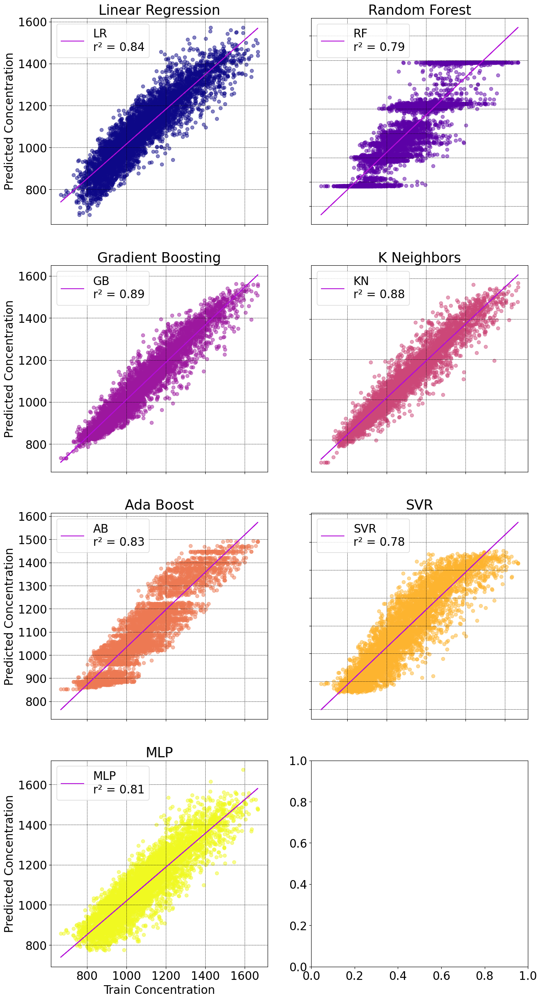

In [40]:
plot_ML_model(0)

In [41]:
score_df_results = pd.concat(all_model_results[1], ignore_index = True).sort_values('Test R2', axis = 0, ascending = False)
score_df_results

,Method,Training MSE,Training R2,Test MSE,Test R2
2,Gradient Boosting,2041.462602,0.957702,2460.714195,0.95099
0,Linear Regression,3356.975434,0.930446,2972.932194,0.940788
6,MLP,4073.57088,0.915599,4124.486922,0.917853
3,K-Neighbors,2773.548768,0.942534,4338.780525,0.913585
4,Ada Boost,4631.846968,0.904031,4975.163222,0.90091
5,SVR,7702.354428,0.840413,7851.237772,0.843627
1,Random Forest,8032.345639,0.833576,8432.510616,0.83205


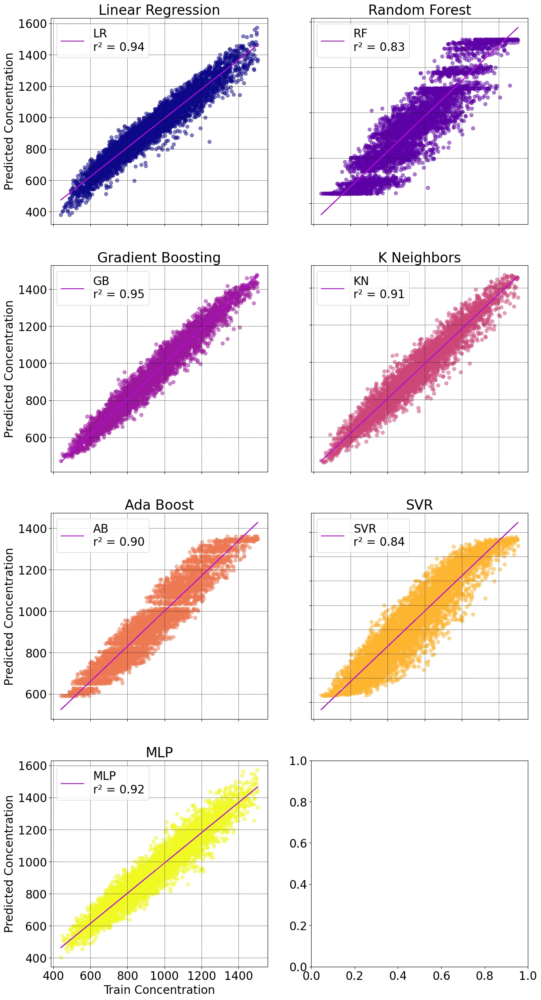

In [42]:
plot_ML_model(1)

In [43]:
score_df_results = pd.concat(all_model_results[2], ignore_index = True).sort_values('Test R2', axis = 0, ascending = False)
score_df_results

,Method,Training MSE,Training R2,Test MSE,Test R2
2,Gradient Boosting,3317.762111,0.913651,4165.357804,0.896959
3,K-Neighbors,3508.565436,0.908686,5142.49282,0.872787
0,Linear Regression,6428.400155,0.832693,6401.287832,0.841648
4,Ada Boost,9594.845991,0.750283,10006.277689,0.752469
1,Random Forest,10109.621542,0.736885,10922.242922,0.729811
5,SVR,13048.353362,0.660401,14256.201783,0.647337
6,MLP,16727.989395,0.564635,18812.022961,0.534637


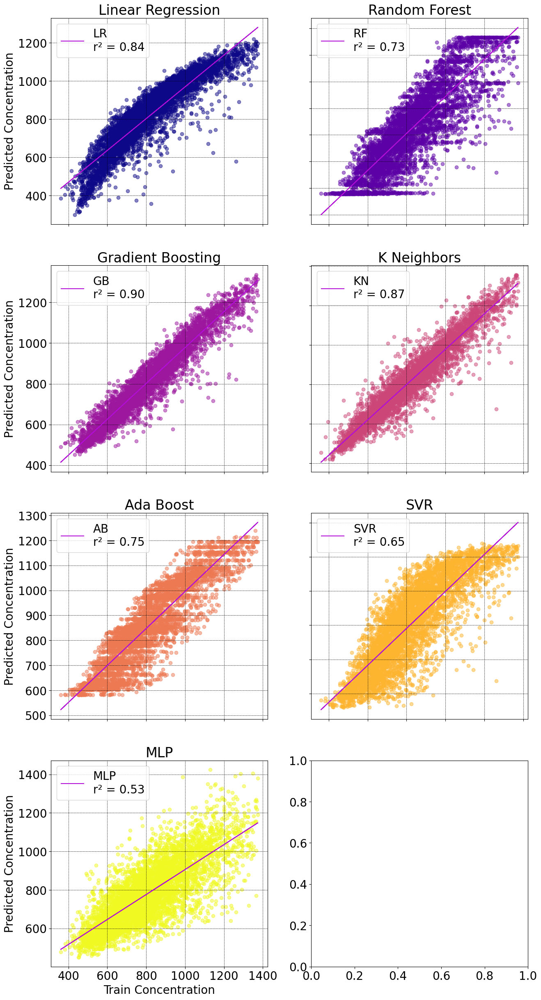

In [44]:
plot_ML_model(2)

In [45]:
score_df_results = pd.concat(all_model_results[3], ignore_index = True).sort_values('Test R2', axis = 0, ascending = False)
score_df_results

,Method,Training MSE,Training R2,Test MSE,Test R2
2,Gradient Boosting,4753.745252,0.956053,5918.001902,0.946243
0,Linear Regression,8731.627758,0.919279,8424.730564,0.923473
6,MLP,11253.294662,0.895967,12246.209003,0.888761
4,Ada Boost,15573.563243,0.856028,16351.357436,0.851471
1,Random Forest,20601.422582,0.809547,21687.130834,0.803003
3,K-Neighbors,17060.185669,0.842284,25372.644361,0.769525
5,SVR,69935.028265,0.353474,70564.466973,0.359022


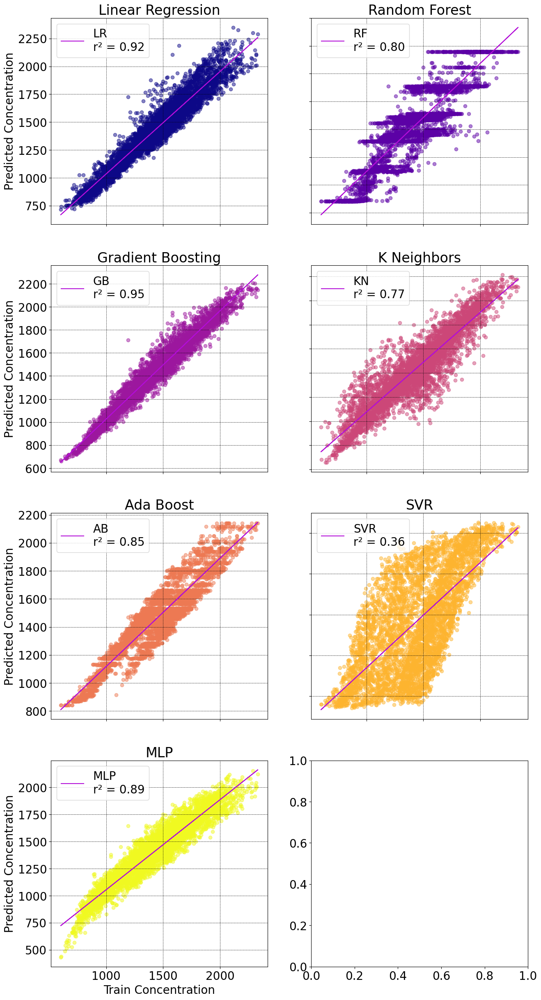

In [46]:
plot_ML_model(3)

In [47]:
score_df_results = pd.concat(all_model_results[4], ignore_index = True).sort_values('Test R2', axis = 0, ascending = False)
score_df_results

,Method,Training MSE,Training R2,Test MSE,Test R2
2,Gradient Boosting,11565.43605,0.896108,15153.952621,0.868631
3,K-Neighbors,9775.791777,0.912184,16090.059115,0.860516
6,MLP,15611.648054,0.85976,16772.690045,0.854598
0,Linear Regression,18053.206166,0.837828,19088.165293,0.834525
4,Ada Boost,19683.333152,0.823185,20307.460227,0.823955
1,Random Forest,23982.186167,0.784568,25338.383224,0.780342
5,SVR,38680.171509,0.652536,39335.160636,0.659005


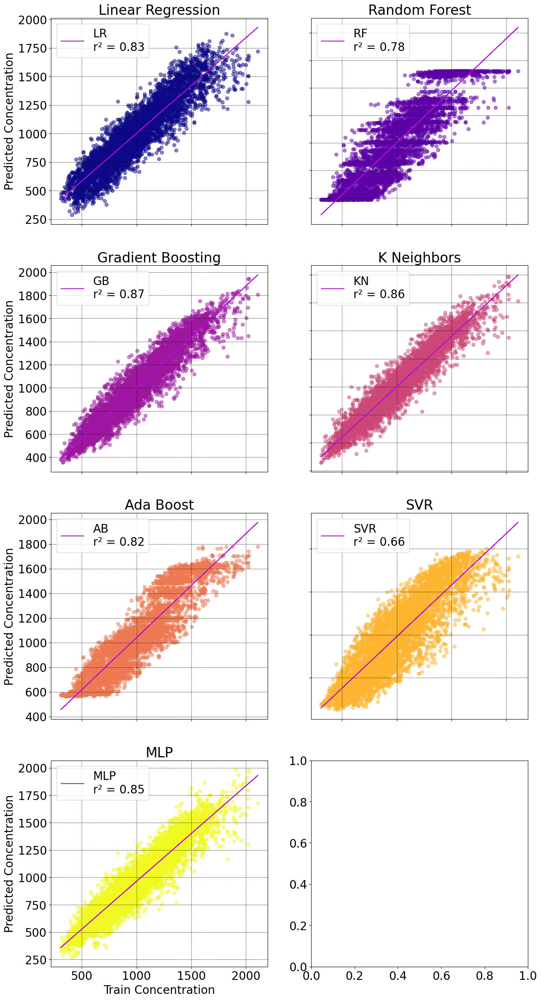

In [48]:
plot_ML_model(4)

### Deep Learning Model - LSTM

In [49]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [50]:
from sklearn.preprocessing import MinMaxScaler
x_train = x_train.values
x_test  = x_test.values
y_train = y_train.values
y_test  = y_test.values

In [51]:
from tensorflow.keras.callbacks import EarlyStopping

# Reshape the data to a 3D tensor [Batchsize, timstamps, features]
x_train = x_train.reshape(x_train.shape[0], 1, x_train.shape[1])
x_test  = x_test.reshape(x_test.shape[0],   1, x_test.shape[1])

In [52]:
print(x_train.shape)
print(x_test.shape)

(4879, 1, 7)
(1220, 1, 7)


In [53]:
import tensorflow as tf

# Define your LSTM model
model = tf.keras.Sequential([
    tf.keras.layers.LSTM(128, return_sequences = True, input_shape = (x_train.shape[1], x_train.shape[2])),
    tf.keras.layers.LSTM(128, return_sequences = True,), 
    tf.keras.layers.LSTM(128, return_sequences = True),
    tf.keras.layers.LSTM(128, return_sequences = True),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(1)
])

In [54]:
# Compile the model
model.compile(optimizer = 'adam', loss = 'mean_squared_error')

In [55]:
# Train the model
model.fit(x_train, y_train, epochs = 250, batch_size = 32)

Epoch 1/250

153/153 [==============================] - 31s 27ms/step - loss: 679483.1875
Epoch 2/250
153/153 [==============================] - 4s 28ms/step - loss: 649282.1250
Epoch 3/250
153/153 [==============================] - 4s 27ms/step - loss: 625128.0625
Epoch 4/250
153/153 [==============================] - 4s 28ms/step - loss: 602226.3125
Epoch 5/250
153/153 [==============================] - 4s 28ms/step - loss: 580295.0625
Epoch 6/250
153/153 [==============================] - 4s 28ms/step - loss: 558859.0000
Epoch 7/250
153/153 [==============================] - 4s 28ms/step - loss: 538432.2500
Epoch 8/250
153/153 [==============================] - 4s 28ms/step - loss: 518236.3438
Epoch 9/250
153/153 [==============================] - 4s 28ms/step - loss: 498845.7812
Epoch 10/250
153/153 [==============================] - 4s 28ms/step - loss: 479991.4375
Epoch 11/250
153/153 [==============================] - 4s 28ms/step - loss: 461826.3125
Epoch 12/250
153/153 [======

153/153 [==============================] - 4s 28ms/step - loss: 39633.8633
Epoch 92/250
153/153 [==============================] - 4s 28ms/step - loss: 39728.4922
Epoch 93/250
153/153 [==============================] - 4s 27ms/step - loss: 39612.5859
Epoch 94/250
153/153 [==============================] - 4s 26ms/step - loss: 39745.6602
Epoch 95/250
153/153 [==============================] - 4s 26ms/step - loss: 39679.1875
Epoch 96/250
153/153 [==============================] - 4s 27ms/step - loss: 39734.7500
Epoch 97/250
153/153 [==============================] - 4s 26ms/step - loss: 39740.8203
Epoch 98/250
153/153 [==============================] - 4s 27ms/step - loss: 39733.6719
Epoch 99/250
153/153 [==============================] - 4s 28ms/step - loss: 39700.7734
Epoch 100/250
153/153 [==============================] - 4s 27ms/step - loss: 39681.5859
Epoch 101/250
153/153 [==============================] - 4s 27ms/step - loss: 39729.8398
Epoch 102/250
153/153 [====================

153/153 [==============================] - 4s 28ms/step - loss: 39719.7539
Epoch 184/250
153/153 [==============================] - 4s 28ms/step - loss: 39809.1758
Epoch 185/250
153/153 [==============================] - 4s 27ms/step - loss: 39676.8203
Epoch 186/250
153/153 [==============================] - 4s 28ms/step - loss: 39733.5664
Epoch 187/250
153/153 [==============================] - 4s 27ms/step - loss: 39695.2930
Epoch 188/250
153/153 [==============================] - 4s 27ms/step - loss: 39732.0195
Epoch 189/250
153/153 [==============================] - 4s 28ms/step - loss: 39624.9570
Epoch 190/250
153/153 [==============================] - 4s 27ms/step - loss: 39662.2344
Epoch 191/250
153/153 [==============================] - 4s 28ms/step - loss: 39727.4414
Epoch 192/250
153/153 [==============================] - 4s 28ms/step - loss: 39675.3555
Epoch 193/250
153/153 [==============================] - 4s 27ms/step - loss: 39713.4844
Epoch 194/250
153/153 [============

In [56]:
# Make predictions
y_pred = model.predict(x_test)

39/39 [==============================] - 6s 10ms/step


In [57]:
y_pred.shape

(1220, 1, 1)

In [58]:
y_test.shape

(1220,)

In [59]:
# Flatten the predictions and ground truth labels
y_pred_flat = y_pred.flatten()

In [60]:
# Evaluate your model using Scikit-learn
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test, y_pred_flat)
print(f'Mean Squared Error: {mse}')

Mean Squared Error: 40636.79754494258
